In [ ]:
pip install opencv-contrib-python==4.5.1.48

     |████████████████████████████████| 56.3 MB 52 kB/s 
  Attempting uninstall: opencv-contrib-python
    Found existing installation: opencv-contrib-python 4.1.2.30
    Uninstalling opencv-contrib-python-4.1.2.30:
      Successfully uninstalled opencv-contrib-python-4.1.2.30


Please follow the below listed steps to run this notebook.

Step1 : If you want to run this notebook, you need to install opencv version 4.5.1.48 cause this version has orb and sift implementation.

Step2 : Since colab's runtime is ephemeral all the files uploaded will be removed since colab spins up a new vm each time you close the notebook. You need to upload the template(template_image.png) and target(test_image.png) images for the beginner's evaluation and target(test_expert_image.png) and just create a templates folder and add the different templates for the expert evaluation. If you don't want to do this, I have already displayed the corresponding results at each cell, you can see that.

Step3 : Just run each cell and I am also sharing the edit rights to this notebook so that you will be able to do it. 

Step4 : See the results.

Thank you!

In [ ]:
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt
from google.colab.patches import cv2_imshow
import os

In [ ]:
def begineer(test_img, template_img):
  w,h = template_img.shape[::-1]
  test_img_gray = cv.cvtColor(test_img,cv.COLOR_BGR2GRAY)
  res = cv.matchTemplate(test_img_gray,template_img,cv.TM_CCOEFF_NORMED)
  threshold = 0.8
  loc = np.where( res >= threshold) #consider only those co-ordinates with maximum match with template  
  for (x,y) in zip(loc[1],loc[0]):
    cv.rectangle(img, (x,y), (x + w, y + h), (255,0,0), 1)
  #cv.imwrite('res.png',img)
  cv2_imshow(test_img)
  return loc

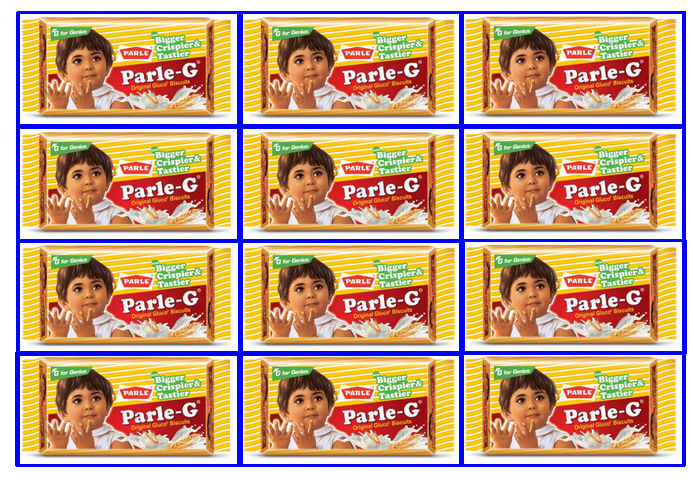

In [ ]:
img = cv.imread('test_image.png')
#img_gray = cv.cvtColor(img,cv.COLOR_BGR2GRAY)
template = cv.imread('template_image.png',0)
#template_gray = cv.cvtColor(template,cv.COLOR_BGR2GRAY)
loc = begineer(img,template)

In [ ]:
def expert_first_try(test_img_gray):

  for images in os.listdir('/content/templates'):
    mytemplate = cv.imread(os.path.join('/content/templates',images),0)
    try:
      result = cv.matchTemplate(test_img_gray,mytemplate,cv.TM_CCOEFF_NORMED)
      minVal,maxVal,minLoc,maxLoc = cv.minMaxLoc(result)
      startX,startY = maxLoc #maxLoc is the x,y co-ordinates of location with the largest normalized correlation cofficient
      endX = startX + mytemplate.shape[1]
      endY = startY + mytemplate.shape[0]
      cv.rectangle(test_img, (startX, startY), (endX, endY), (255, 0 , 0), 1)
      #cv.imwrite('expert.png',test_img)
      cv2_imshow(test_img)
    except:
      print("Exception for:",mytemplate)

"""
Template matching works only if pattern has similar dimensions of the target.
It doesn't work on titled or angeled images since the algorithm would have 
hard time finding the correspondence.
"""

"\nTemplate matching works only if pattern has similar dimensions of the target.\nIt doesn't work on titled or angeled images since the algorithm would have \nhard time finding the correspondence.\n"

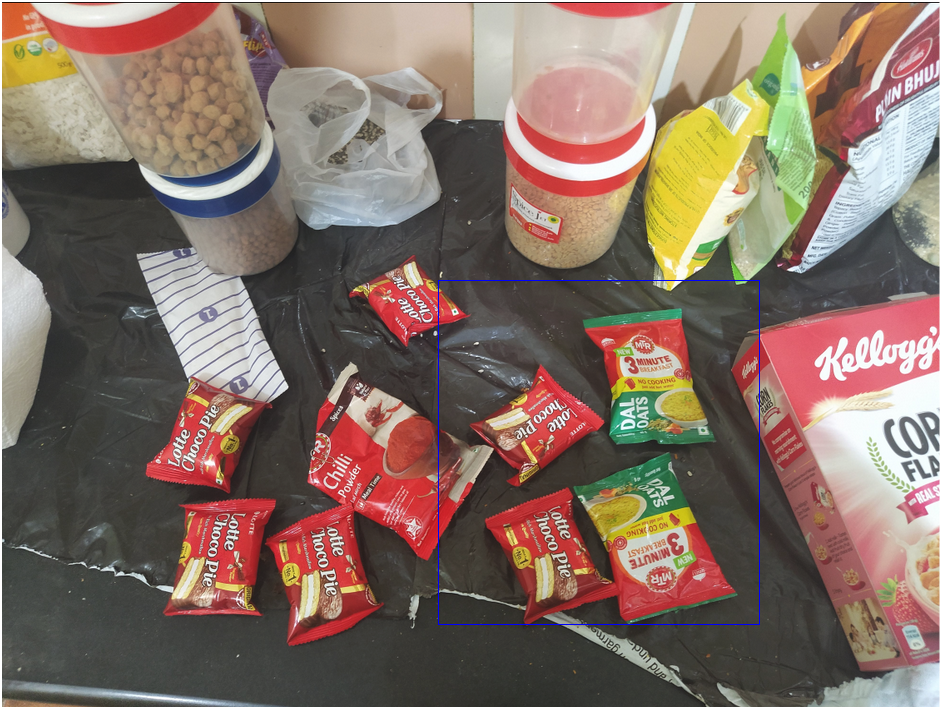

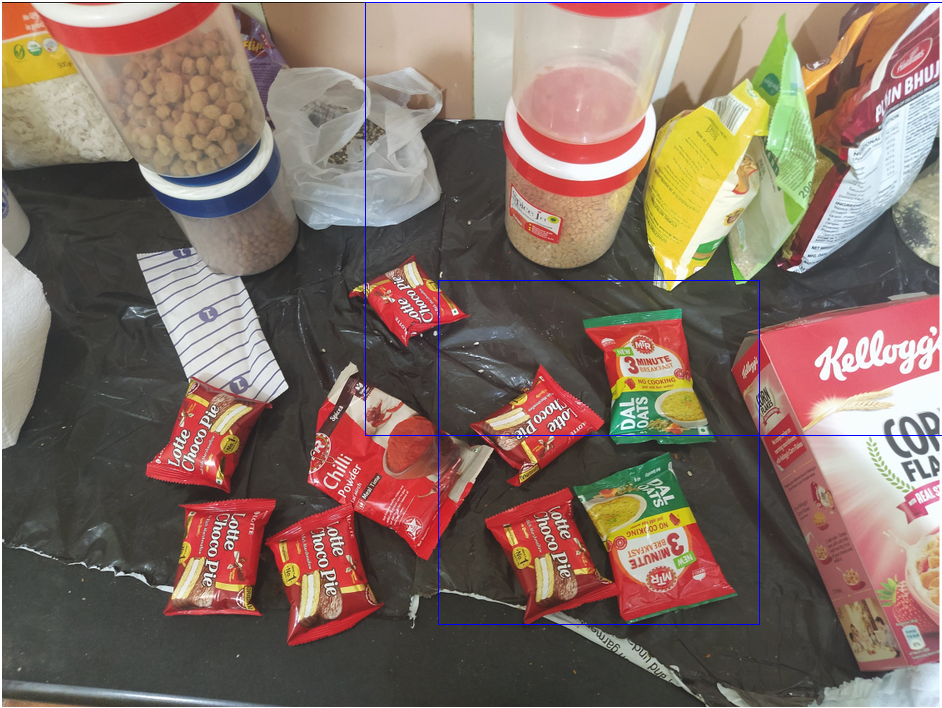

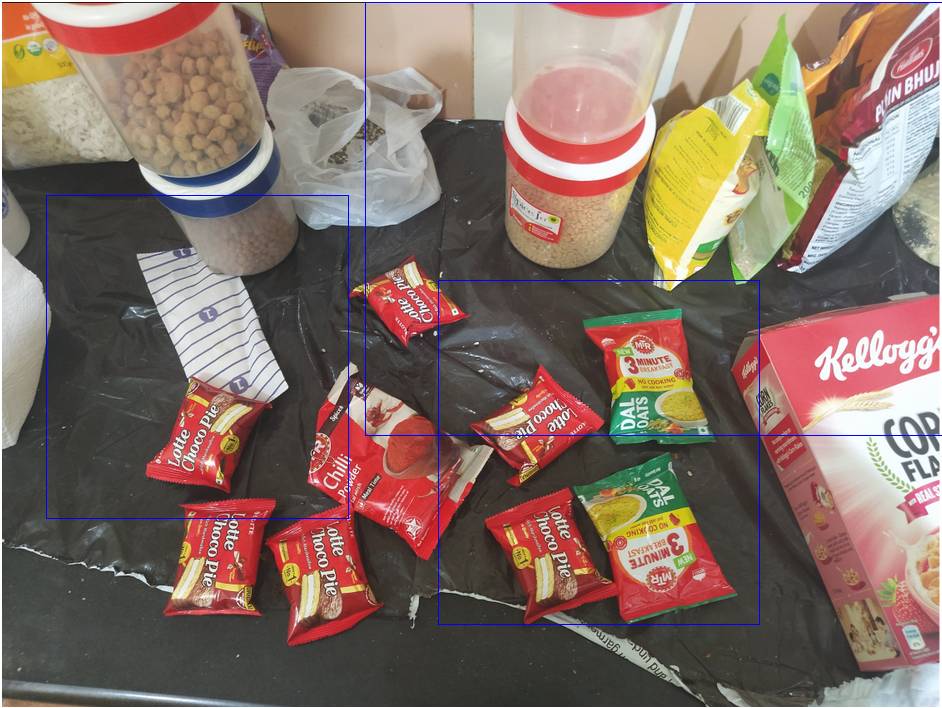

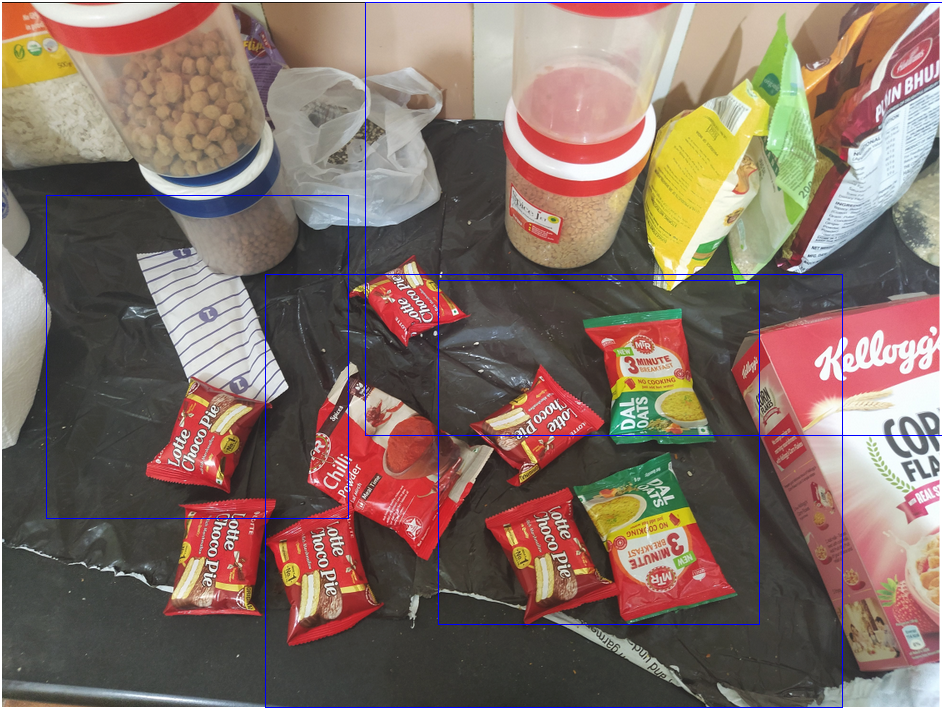

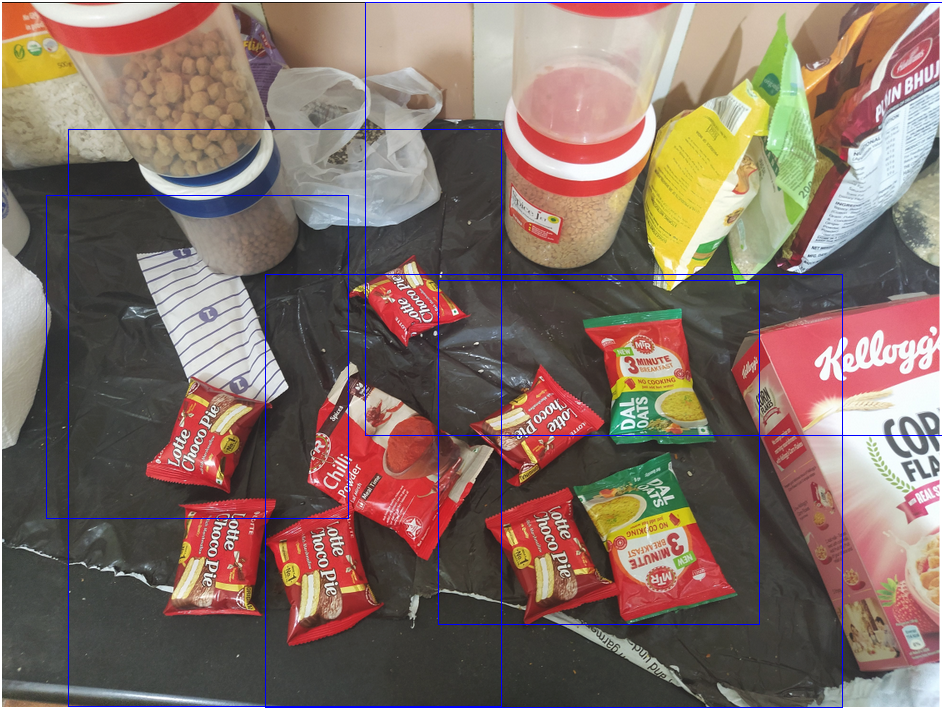

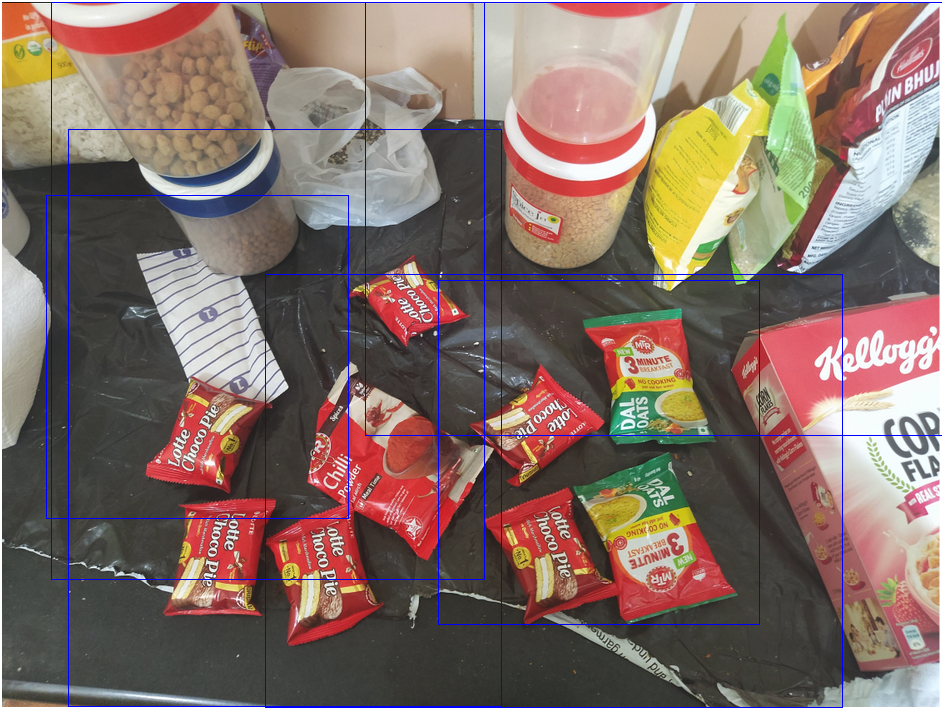

In [ ]:
test_img = cv.imread('test_expert_image.png')
test_img_gray = cv.cvtColor(test_img,cv.COLOR_BGR2GRAY)
expert_first_try(test_img_gray)
#you can see the results below.

In [ ]:
import os
import matplotlib.pyplot as plt
%matplotlib inline 

min_matches = 10
#count = 0
#query images

def expert_second_try(train_image):

  for images in os.listdir('/content/templates'):
    query_image = cv.imread(os.path.join('/content/templates',images))

    orb = cv.ORB_create(nfeatures=100000)
    features1,des1 = orb.detectAndCompute(query_image,None)
    features2,des2 = orb.detectAndCompute(train_image,None)

    bf = cv.BFMatcher(cv.NORM_HAMMING)
    matches = bf.knnMatch(des1, des2, k=2) #returns k best matches

    #Nearest neighbour ratio test to find good matches
    good = []    
    for m, n in matches:
      if m.distance < 0.8 * n.distance:
        good.append(m)

    if len(good) >= min_matches:
      src_pts  = np.float32([features1[m.queryIdx].pt for m in good]).reshape(-1,1,2)
      dst_pts  = np.float32([features2[m.trainIdx].pt for m in good]).reshape(-1,1,2)

      M,_ = cv.findHomography(src_pts, dst_pts, cv.RANSAC,5.0)
      h,w = query_image.shape[:2]
      pts = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0] ]).reshape(-1,1,2)
      dst = cv.perspectiveTransform(pts,M)
      result = cv.polylines(train_image, [np.int32(dst)], True, (0,255,0), 1, cv.LINE_AA)
    else:
       print('Not enough good matches are found - {}/{}'.format(len(good), min_matches))
  
  #cv2.imwrite("/content/out/output"+str(count)+".png",result)
  #count+=1
    cv2_imshow(result)

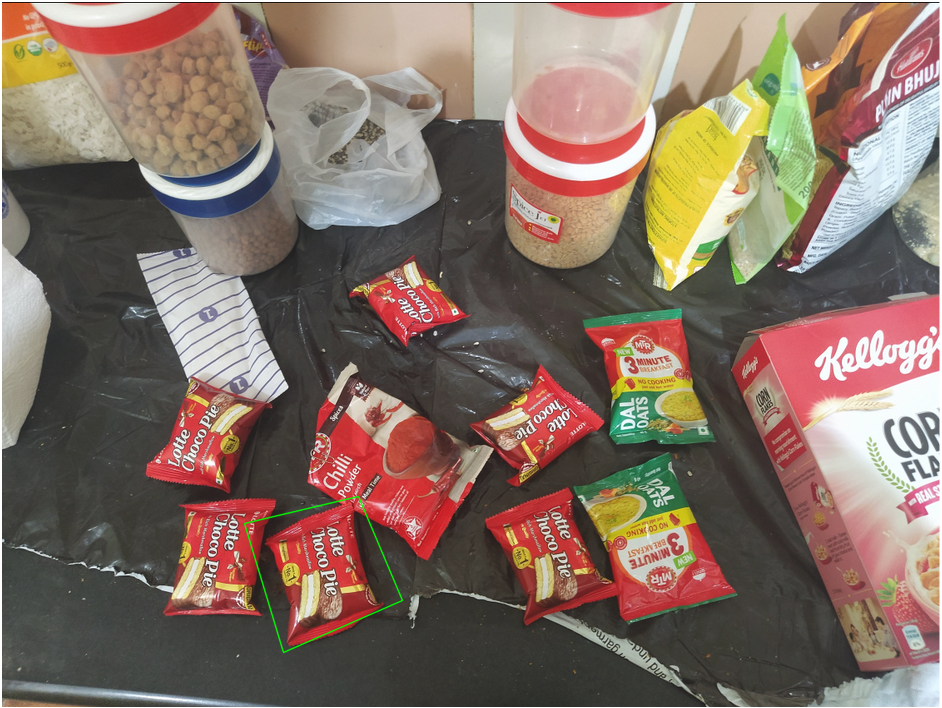

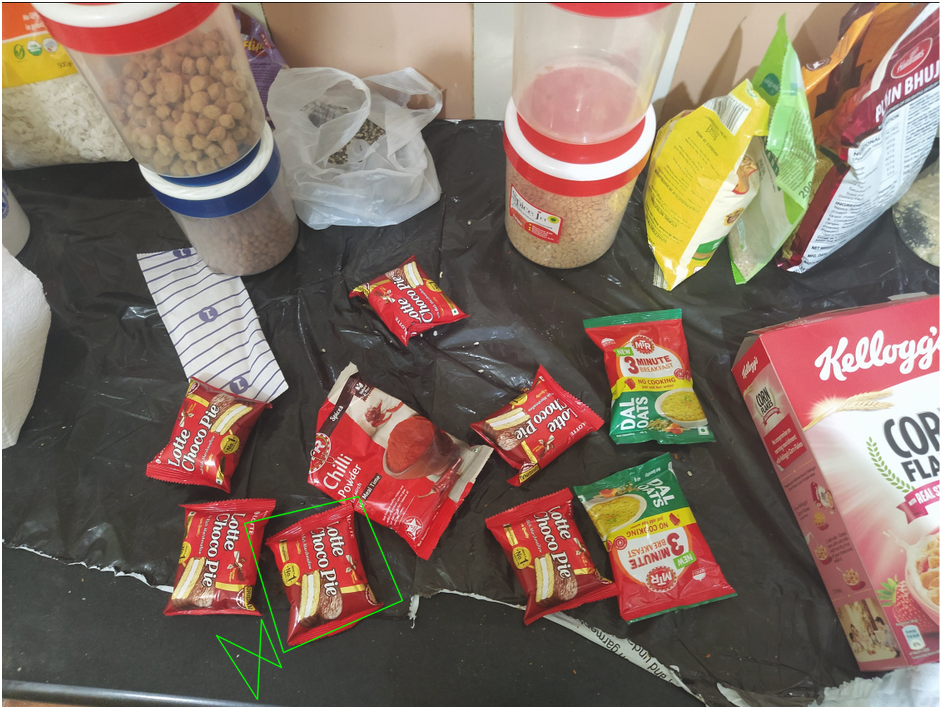

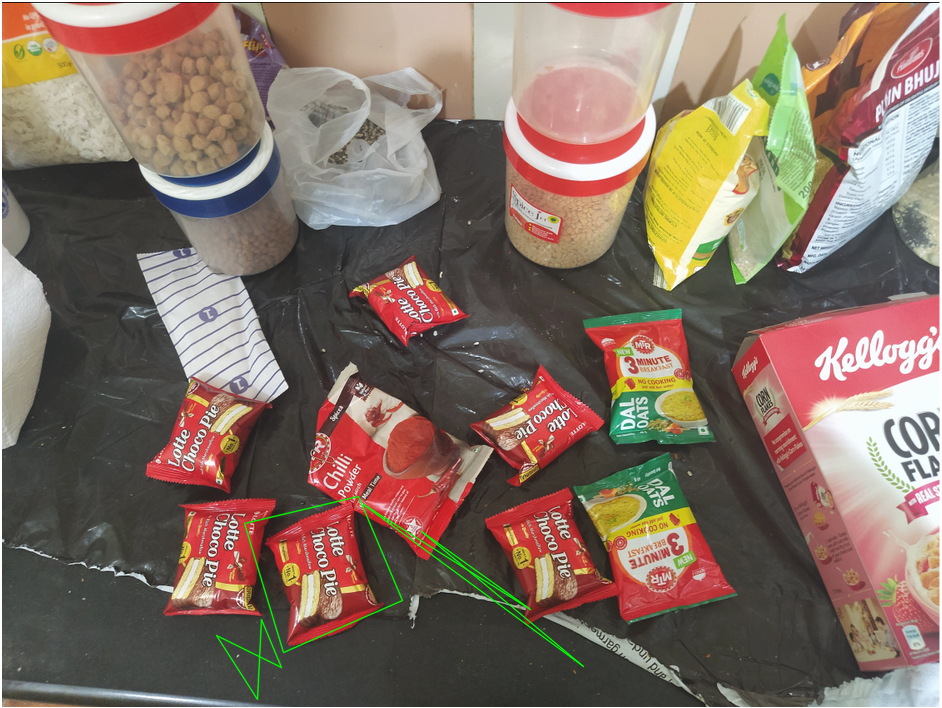

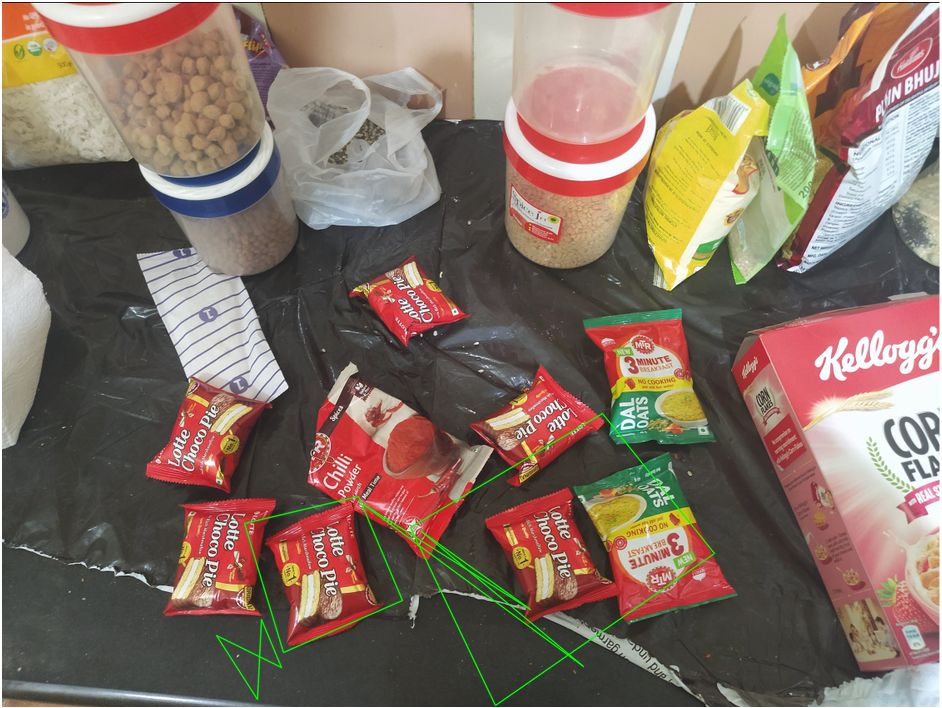

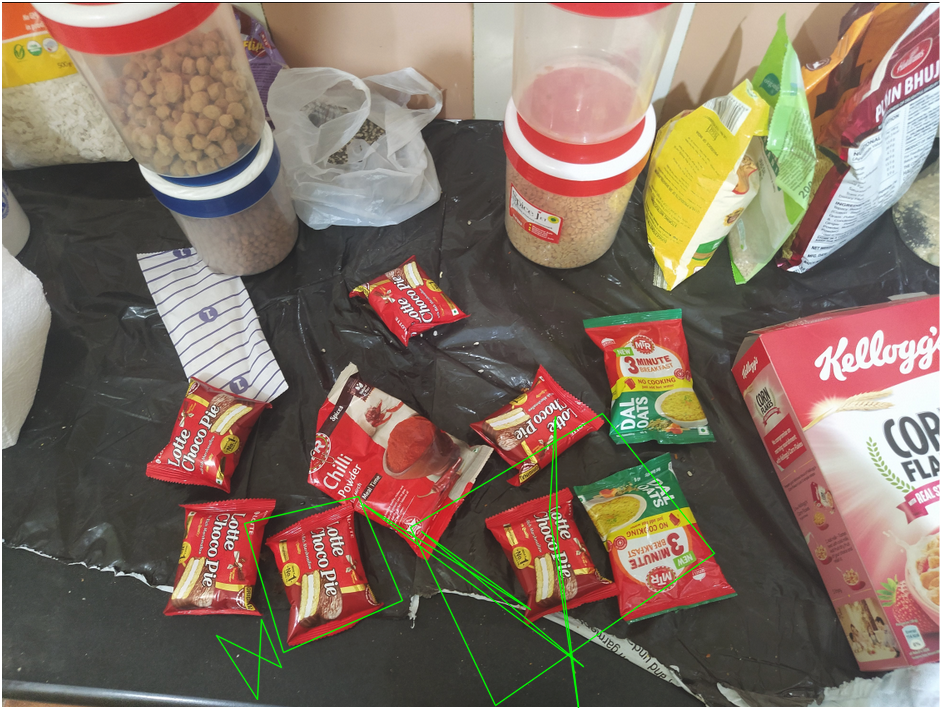

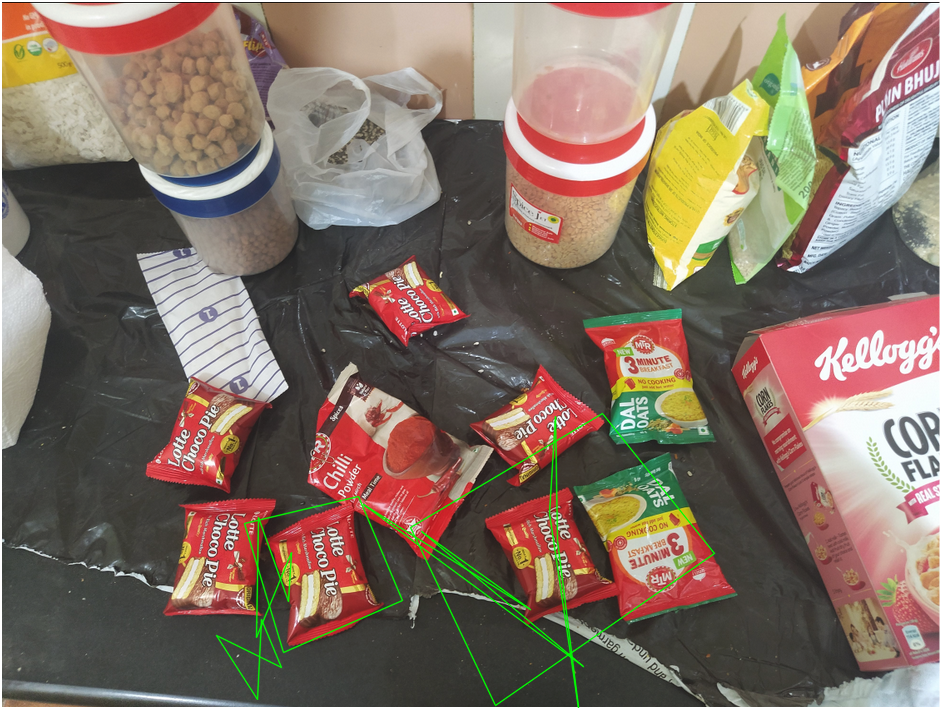

In [ ]:
train_image = cv.imread('test_expert_image.png') #target image
expert_second_try(train_image)
#you can the results below
#Since orb or sift explicity works by assuming that there's is only one match in
#the target image, its considering only the best match.

In [ ]:
'''
SIFT Matching which gives not so good results as the above ORB one.
import matplotlib.pyplot as plt
%matplotlib inline 

# Loading the image
img = cv.imread('test_expert_image.png')
template = cv.imread('choco_pie_top.png')

# Applying SIFT detector
sift = cv.SIFT_create()
kp_img,desc_img = sift.detectAndCompute(img,None)
kp_template,desc_template = sift.detectAndCompute(template,None)

bf = cv.BFMatcher()
matches = bf.knnMatch(desc_img,desc_template,k=2)

good = []
for m,n in matches:
  if m.distance < 0.5*n.distance:
    good.append(m)

img3 = cv.drawMatches(img,kp_img,template,kp_template,good,None,flags=2)
cv2_imshow(img3)

'''

In [ ]:
#extra things I tried out

#countour thresholding and filtering approach
'''
image = cv.imread('test_expert_image.png')
gray = cv.cvtColor(image, cv.COLOR_BGR2GRAY)
blur = cv.GaussianBlur(gray, (5,5), 0)
thresh = cv.threshold(blur, 0, 255, cv.THRESH_BINARY_INV + cv.THRESH_OTSU)[1]

cnts = cv.findContours(thresh, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
cnts = cnts[0] if len(cnts) == 2 else cnts[1]
for c in cnts:
    area = cv.contourArea(c)
    if area > 10000:
        cv.drawContours(image, [c], -1, (36,255,12), 3)

cv.imwrite('thresh.png', thresh)
cv.imwrite('image.png', image)
cv.waitKey()

im = cv.imread('choco_pie_top.png')
imgray = cv.cvtColor(im, cv.COLOR_BGR2GRAY)
ret, thresh = cv.threshold(imgray, 127, 255, 0)
contours, hierarchy = cv.findContours(thresh, cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE)
cv2_imshow(cv.drawContours(im, contours, -1, (0,255,0), 3))

import numpy as np
#from matplotlib.pyplot import plt

min_matches = 10

query_image = cv.imread('choco_pie_top.png') #query image
train_image = cv.imread('test_expert_image.png') #train image

orb = cv.ORB_create(nfeatures=100000)
features1,des1 = orb.detectAndCompute(query_image,None)
features2,des2 = orb.detectAndCompute(train_image,None)

bf = cv.BFMatcher(cv.NORM_HAMMING)
matches = bf.knnMatch(des1, des2, k=2) #returns k best matches

# Nearest neighbour ratio test to find good matches
good = []    
#matches1 = [match for match in matches if len(match) == 2] 
for m, n in matches:
  if m.distance < 0.8 * n.distance:
    good.append(m)


#img3 = cv.drawMatches(query_image,features1,train_image,features2,good,None,flags=2)
#cv2_imshow(img3)

src_pts  = np.float32([features1[m.queryIdx].pt for m in good]).reshape(-1,1,2)
dst_pts  = np.float32([features2[m.trainIdx].pt for m in good]).reshape(-1,1,2)

M,mask = cv.findHomography(src_pts, dst_pts, cv.RANSAC,5.0)
matchesMask = mask.ravel().tolist()

h,w = query_image.shape[:2]
pts = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0] ]).reshape(-1,1,2)
dst = cv.perspectiveTransform(pts,M)
  
train_image = cv.polylines(train_image, [np.int32(dst)], True, (0,255,0), 2, cv.LINE_AA)

#draw_params = dict(matchColor = (0,255,0), # draw matches in green color
#                   singlePointColor = None,
#                   matchesMask = matchesMask, # draw only inliers
#                   flags = 2)
#res = cv.drawMatches(query_image,features1,train_image,features2,good,None,**draw_params)

cv2_imshow(train_image)

'''